# MPI for Python - A very quick introduction

- MPI - Message Passing Interface. MPI takes care of the information transfer between different processors
- MPI is implemented in many different languages (C/C++/fortran)
- MPI for Python __mpi4py__ (https://github.com/mpi4py) implements a Python interface to almost all functions in the entire MPI standard
- MPI through mpi4py is very nearly as fast as pure C
- Very high level of abstraction makes it ideal for learning basic MPI:-)
- Typically used to run __one__ program on __many__ processors - High performance computing

# Hello World - Fortran90 MPI

In [ ]:
%%file helloworld.f90
program hello_world

  ! Include the MPI library definitons:
  include 'mpif.h'

  integer numtasks, rank, ierr

  call MPI_INIT(ierr)

  ! Get the number of processors
  call MPI_COMM_SIZE(MPI_COMM_WORLD, numtasks, ierr)

  ! Get the rank of the process
  call MPI_COMM_RANK(MPI_COMM_WORLD, rank, ierr)

  print "('Hello World! from rank',I3,' of ',I3,' processors')",&
       rank, numtasks

  call MPI_FINALIZE(ierr)

end program hello_world

- Compile and run

In [ ]:
!mpif90 helloworld.f90 -o helloworld

In [ ]:
!mpirun -np 4 ./helloworld

# Hello World - C++ MPI

In [ ]:
%%file helloworld.cpp
#include <mpi.h>
#include <stdio.h>
int main(int argc, char** argv) {
    
    MPI_Init(NULL, NULL);

    // Get the number of processes
    int world_size;
    MPI_Comm_size(MPI_COMM_WORLD, &world_size);

    // Get the rank of the process
    int world_rank;
    MPI_Comm_rank(MPI_COMM_WORLD, &world_rank);

    printf("Hello World! from rank %d of %d processors\n",
           world_rank, world_size);

    MPI_Finalize();
}

- Compile and run

In [ ]:
!mpicc helloworld.cpp -o helloworldcpp

In [ ]:
!mpirun -np 2 ./helloworldcpp

# Hello World - Python

In [ ]:
%%file helloworld.py
from mpi4py import MPI
comm = MPI.COMM_WORLD
print("Hello World! from rank", comm.Get_rank(), "of", comm.Get_size(), "processors")

- Just run - no compilation required. No initialization and no finalize

In [ ]:
!mpirun -np 4 python helloworld.py

# Point-to-point communications

## Send and receive

The most basic MPI operation is to send a message from one processor (rank) and receive it on another.

Lets make a Python script that runs with 2 processors, creates an array of random numbers on each rank, and sends it to the other.

In [ ]:
%%file sendrecv.py
from mpi4py import MPI
comm = MPI.COMM_WORLD
assert comm.Get_size() == 2
import numpy as np   # numpy module for doing math with arrays in Python
import sys           # sys module used here for handling input parameter

rank = comm.Get_rank()
N = eval(sys.argv[-1])         # Get the last argument in the call to program
sendarray = np.random.random(N)# Create N random floats
recvarray = np.zeros(N)
comm.Send(sendarray, dest=(rank+1)%2)    # Large S in Send for numpy arrays
comm.Recv(recvarray, source=(rank+1)%2)  # Large R in Recv for numpy arrays

print("Rank", rank, "sent the array    ", sendarray)
print("Rank", rank, "received the array", recvarray)

In [ ]:
!mpirun -np 2 python sendrecv.py 4

In [ ]:
%%file sendrecv2D.py
from mpi4py import MPI
comm = MPI.COMM_WORLD
assert comm.Get_size() == 2
import numpy as np
import sys

rank = comm.Get_rank()
N = eval(sys.argv[-2])   # Get the two commandline arguments
M = eval(sys.argv[-1])
sendarray = np.random.random((N, M))   # Create 2D array of random floats
recvarray = np.zeros((N, M))
comm.Send(sendarray, dest=(rank+1)%2)  # Same call as for 1D arrays!
comm.Recv(recvarray, source=(rank+1)%2)

print("Rank", rank, "sent the array    ", sendarray)
print("Rank", rank, "received the array", recvarray)

In [ ]:
!mpirun -np 2 python sendrecv2D.py 2 2

# Collective operations

All possible with mpi4py

- Broadcast
- Reduce
- Scatter
- Gather
- Allgather
- Alltoall

# Broadcast
Send the message 'Hi!' from processor rank 0 to all other processes

<div class="sl-block is-focused" data-block-type="image" style="min-width: 1px; min-height: 1px; width: 360px; height: 264.059px; left: 0px; top: 427.971px;" data-name="image-bfadcc" data-origin-id="d64298835ea5edaf911adfded9b9e517"><div class="sl-block-content" style="z-index: 19;"><img style="" data-natural-width="1227" data-natural-height="900" data-lazy-loaded="" src="https://s3.amazonaws.com/media-p.slid.es/uploads/92046/images/1504036/Bcasdt2.png"></div></div>

In [ ]:
%%file bcast.py 
from mpi4py import MPI
comm = MPI.COMM_WORLD
rank = comm.Get_rank()
message = None
if rank == 0:
    message = "Hei!"
message = comm.bcast(message, root=0)
if rank > 0:
    print("Rank 0 says", message, "to rank", rank)

In [ ]:
!mpirun -np 4 python bcast.py

# Scatter
Rank 0 sends a different number to all other ranks
<div class="sl-block is-focused" data-block-type="image" style="min-width: 1px; min-height: 1px; width: 360px; height: 264.059px; left: 301px; top: 415px;" data-origin-id="27c70a939bc7353f08eca74513b2d989"><div class="sl-block-content" style="z-index: 10;"><img style="" data-natural-width="1227" data-natural-height="900" data-lazy-loaded="" src="https://s3.amazonaws.com/media-p.slid.es/uploads/92046/images/1504081/Scatter2.png"></div></div>

In [ ]:
%%file scatter.py
from mpi4py import MPI
import numpy as np
comm = MPI.COMM_WORLD
rank = comm.Get_rank()
size = comm.Get_size()
data = None
if rank == 0:
    data = list(np.arange(size)**2)
data = comm.scatter(data, root=0)
print("Rank", rank, "data =", data)

In [ ]:
!mpirun -np 4 python scatter.py

# Alltoall

In [ ]:
%%file alltoall.py
from mpi4py import MPI
comm = MPI.COMM_WORLD
rank = comm.Get_rank()
data = range(comm.Get_size())  # [0, 1, 2, ..., size-1]
print("Before - On rank", rank,"data =", list(data))
data = comm.alltoall(data)
print("After  - On rank", rank,"data =", data)

In [ ]:
!mpirun -np 4 python alltoall.py

# High performance computing
## The SpectralDNS project - proof of concept

<center>
<div class="sl-block" data-block-type="image" style="min-width: 1px; min-height: 1px; width: 500px;" data-block-id="8c73e5de944a56abf523599385cfa3eb">
    <div class="sl-block-content" style="z-index: 13;">
        <img style="" data-natural-width="600" data-natural-height="400" data-lazy-loaded="" src="https://s3.amazonaws.com/media-p.slid.es/uploads/92046/images/1673682/oie_transparent.png">
    </div>
</div>

Direct Numerical Simulations (DNS) of turbulence have been performed with low-level Fortran or C for more than 50 years. The largest simulations now have size of the order of $10,000^3$, in three-dimensional space + time. Using triply-periodic Fourier exponentials in all three directions $\Omega=[0, 2\pi]^3$, solving Navier-Stokes
    
 <div class="sl-block-content" style="z-index: 12;">
            <img style="" data-natural-width="500" data-natural-height="100" data-lazy-loaded="" src="https://s3.amazonaws.com/media-p.slid.es/uploads/92046/images/1662847/NSlatex_F.png">
        </div>

where
<center>
<div class="sl-block-content" style="z-index: 13; width:350px; height: 50">
        <img style="" data-natural-width="250" data-natural-height="100" data-lazy-loaded="" src="https://s3.amazonaws.com/media-p.slid.es/uploads/92046/images/1662811/NSlatex_u.png">
    </div>

 <div class="sl-block-content" style="z-index: 16;">
        <img style="" width="200" height="36" data-lazy-loaded="" src="https://s3.amazonaws.com/media-p.slid.es/uploads/92046/images/2555968/CodeCogsEqn-52.png">
    </div>


    

# What does it really take to implement this?

- __Distribution of structured data arrays__
- __Fast Fourier transforms (FFT) in parallel__
- __A time integrator__

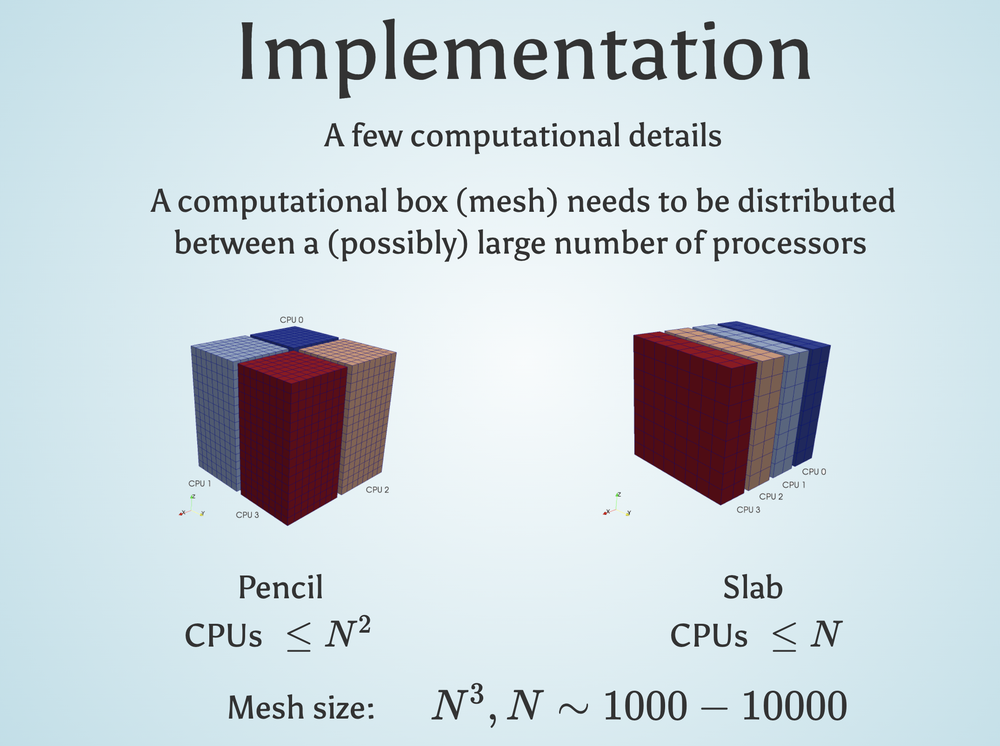

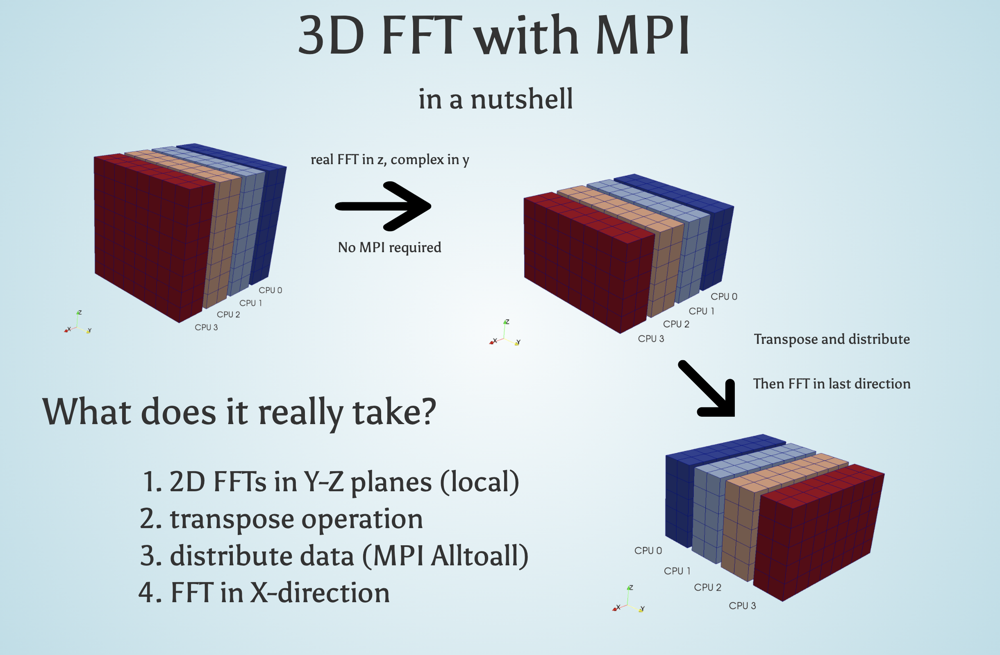
    

It turns out that 4 lines of Python code is sufficient to do the parallel FFT, and [100 lines of Python code](https://github.com/spectralDNS/spectralDNS/blob/master/spectralDNS3D_short.py) solves the Navier-Stokes equations. But in all fairness, the high-level [C++ code](https://github.com/spectralDNS/spectralDNS/blob/master/cpp/spectralDNS.cpp) we compare with is not more than 320 lines.
The figure below show the scaling of the solvers up to 4096 processor cores.

<img style="" data-natural-width="600" data-natural-height="400" data-lazy-loaded="" src="https://s3.amazonaws.com/media-p.slid.es/uploads/92046/images/2561419/strong_scaling_shaheen_noopt_512.png">

We then optimized the Python code using Cython and Numba

<div class="sl-block-content" style="z-index: 14;">
        <img data-natural-width="600" data-natural-height="400" style="" data-lazy-loaded="" src="https://s3.amazonaws.com/media-p.slid.es/uploads/92046/images/2561432/strong_scaling_shaheen_opt_512.png">
</div>

Later, on a larger supercomputer

<div class="sl-block-content" style="z-index: 11;">
        <img data-natural-width="800" data-natural-height="600" style="" data-lazy-loaded="" src="https://s3.amazonaws.com/media-p.slid.es/uploads/92046/images/2561454/string_scaling_pencil_col.png">
    </div>

# Concept proved!

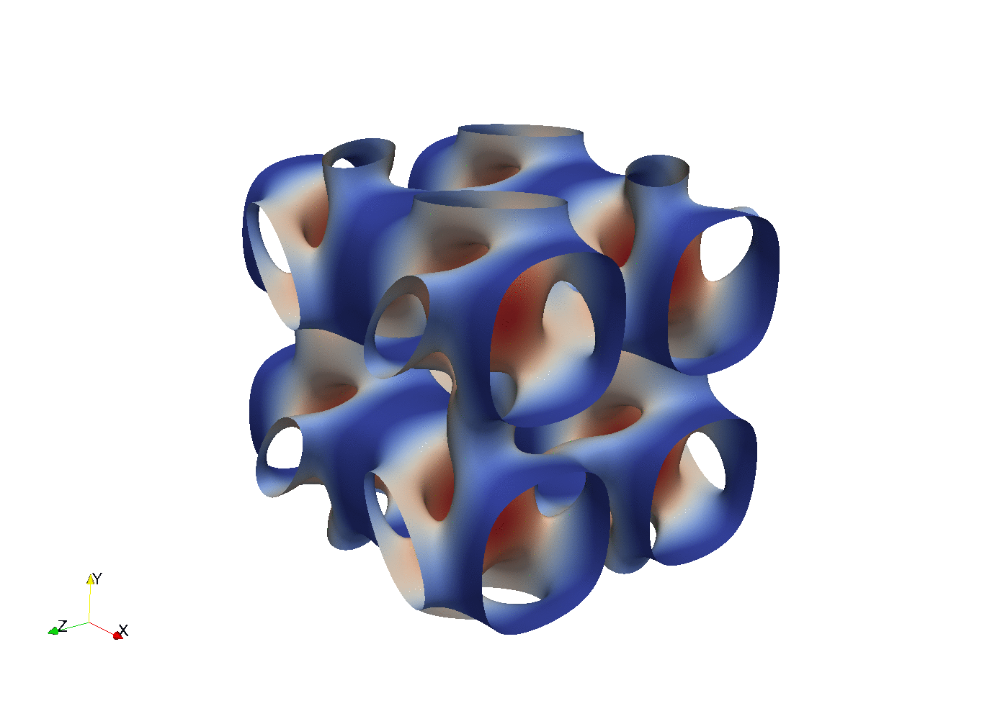

# Over to Shenfun and more spectral basis functions!